In [38]:
import os
import pandas as pd
pd.set_option('display.max_rows',100)
pd.set_option('display.max_columns',200)
import matplotlib.pyplot as plt
import matplotlib.colors
from scipy.stats import pearsonr
import seaborn as sns
from scipy import stats
%matplotlib inline
sns.set()
import seaborn as sns
import plotly.plotly as py
import plotly.tools as tls
import numpy as np
import pandas_profiling
import folium
import warnings
warnings.filterwarnings('ignore')

In [82]:
tb_estab = pd.read_csv('tbEstabelecimento201908.csv', sep = ';', header=0, encoding='utf-8')
tb_estab = tb_estab.add_suffix('_tbEstabelecimento')
tb_estab.shape

(387467, 54)

In [83]:
tb_TipoUnidade = pd.read_csv('tbTipoUnidade201908.csv', sep = ';', header=0,encoding='utf-8')
tb_TipoUnidade = tb_TipoUnidade.add_suffix('_tbTipoUnidade')
tb_TipoUnidade.shape

(39, 2)

In [84]:
tb_proj_pop = pd.read_csv('estimativa_TCU_2019_20190917.csv', sep = ';', header=0,encoding='utf-8')
tb_proj_pop = tb_proj_pop.add_suffix('_tbProjPopTCU')
tb_proj_pop.shape

(5570, 7)

In [85]:
tb_mun_latlong = pd.read_csv('municipios_lat_long.csv', sep = ',', header=0,encoding='utf-8')
tb_mun_latlong = tb_mun_latlong.add_suffix('_tbMunLatLong')
tb_mun_latlong = tb_mun_latlong[['codigo_ibge_tbMunLatLong','capital_tbMunLatLong','latitude_tbMunLatLong','longitude_tbMunLatLong']]
tb_mun_latlong.shape

(5570, 4)

In [6]:
tb_mun_latlong

,codigo_ibge_tbMunLatLong,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong
0,5200050,0,-16.757300,-49.4412
1,3100104,0,-18.483100,-47.3916
2,5200100,0,-16.197000,-48.7057
3,3100203,0,-19.155100,-45.4444
4,1500107,0,-1.721830,-48.8788
5,2300101,0,-7.345880,-39.0416
6,2900108,0,-13.248800,-41.6619
7,2900207,0,-8.720730,-39.1162
8,4100103,0,-23.304900,-50.3133
9,4200051,0,-27.612600,-51.0233


In [87]:
tb_proj_pop

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945
1,RO,11,23,1100023,110002,Ariquemes,107863
2,RO,11,31,1100031,110003,Cabixi,5312
3,RO,11,49,1100049,110004,Cacoal,85359
4,RO,11,56,1100056,110005,Cerejeiras,16323
5,RO,11,64,1100064,110006,Colorado do Oeste,15882
6,RO,11,72,1100072,110007,Corumbiara,7391
7,RO,11,80,1100080,110008,Costa Marques,18331
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374
9,RO,11,106,1100106,110010,Guajará-Mirim,46174


In [8]:
tb_estabcomp = pd.read_csv('rlEstabComplementar201908.csv', sep = ';', header=0, encoding='latin-1')
tb_estabcomp = tb_estabcomp.add_suffix('_rlEstabComplementar')
tb_estabcomp.shape

(55096, 10)

In [9]:
tb_estabcomp = tb_estabcomp.groupby(['CO_UNIDADE_rlEstabComplementar'])['QT_EXIST_rlEstabComplementar'].sum().reset_index()
tb_estabcomp.rename({'QT_EXIST_rlEstabComplementar': 'QT_EXIST_LEITOS_rlEstabComplementar'}, axis=1, inplace=True)
tb_estabcomp

,CO_UNIDADE_rlEstabComplementar,QT_EXIST_LEITOS_rlEstabComplementar
0,1100012516500,6
1,1100012679477,45
2,1100022494280,36
3,1100022494299,67
4,1100022515504,22
5,1100022515520,3
6,1100022515555,43
7,1100022515598,49
8,1100022515601,23
9,1100025082145,15


In [10]:
tb_estab = pd.merge(tb_estab, tb_TipoUnidade, left_on="TP_UNIDADE_tbEstabelecimento", right_on="CO_TIPO_UNIDADE_tbTipoUnidade", how='inner')
tb_estab = tb_estab.drop(['CO_TIPO_UNIDADE_tbTipoUnidade'], axis=1)
tb_estab.shape

(387467, 55)

In [11]:
tb_estab = pd.merge(tb_estab, tb_estabcomp, left_on="CO_UNIDADE_tbEstabelecimento", right_on="CO_UNIDADE_rlEstabComplementar", how='left')
tb_estab = tb_estab.drop(['CO_UNIDADE_rlEstabComplementar'], axis=1)
tb_estab['QT_EXIST_LEITOS_rlEstabComplementar'].fillna(0, inplace=True)
tb_estab.shape

(387467, 56)

In [12]:
tb_estab = tb_estab[['CO_UNIDADE_tbEstabelecimento','CO_CNES_tbEstabelecimento','DS_TIPO_UNIDADE_tbTipoUnidade','CO_MUNICIPIO_GESTOR_tbEstabelecimento','QT_EXIST_LEITOS_rlEstabComplementar']]

In [13]:
tb_estab

,CO_UNIDADE_tbEstabelecimento,CO_CNES_tbEstabelecimento,DS_TIPO_UNIDADE_tbTipoUnidade,CO_MUNICIPIO_GESTOR_tbEstabelecimento,QT_EXIST_LEITOS_rlEstabComplementar
0,3111106673937,6673937,CENTRO DE SAUDE/UNIDADE BASICA,311110,0.0
1,3530607781717,7781717,CENTRO DE SAUDE/UNIDADE BASICA,353060,0.0
2,2312909205098,9205098,CENTRO DE SAUDE/UNIDADE BASICA,231290,0.0
3,4314907794541,7794541,CENTRO DE SAUDE/UNIDADE BASICA,431490,0.0
4,3151809061878,9061878,CENTRO DE SAUDE/UNIDADE BASICA,315180,0.0
5,2311707902123,7902123,CENTRO DE SAUDE/UNIDADE BASICA,231170,0.0
6,3143307780885,7780885,CENTRO DE SAUDE/UNIDADE BASICA,314330,0.0
7,5005009047662,9047662,CENTRO DE SAUDE/UNIDADE BASICA,500500,0.0
8,2903909109587,9109587,CENTRO DE SAUDE/UNIDADE BASICA,290390,0.0
9,5103359102701,9102701,CENTRO DE SAUDE/UNIDADE BASICA,510335,0.0


In [14]:
((tb_estab.isnull() | tb_estab.isna()).sum() * 100 / tb_estab.index.size).round(2)

CO_UNIDADE_tbEstabelecimento             0.0
CO_CNES_tbEstabelecimento                0.0
DS_TIPO_UNIDADE_tbTipoUnidade            0.0
CO_MUNICIPIO_GESTOR_tbEstabelecimento    0.0
QT_EXIST_LEITOS_rlEstabComplementar      0.0
dtype: float64

In [15]:
tb_estab_crosstab = pd.crosstab(tb_estab.CO_MUNICIPIO_GESTOR_tbEstabelecimento, tb_estab.DS_TIPO_UNIDADE_tbTipoUnidade)
colunas = tb_estab_crosstab.columns
colunas.tolist()
ind = pd.Index([e for e in colunas.tolist()])
tb_estab_crosstab.columns = ind
tb_estab_crosstab = tb_estab_crosstab.reset_index()
tb_estab_crosstab.columns = ['CO_MUNICIPIO_GESTOR_tbEstabelecimento', 'CENTRAL_DE_ABASTECIMENTO', 'CENTRAL_DE_GESTAO_EM_SAUDE', 'CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL', 'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE', 'CENTRAL_DE_REGULACAO_DO_ACESSO', 'CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS', 'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA', 'CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA', 'CENTRO_DE_ATENCAO_PSICOSSOCIAL', 'CENTRO_DE_IMUNIZACAO', 'CENTRO_DE_PARTO_NORMAL_-_ISOLADO', 'CENTRO_DE_SAUDE_UNIDADE_BASICA', 'CLINICA_CENTRO_DE_ESPECIALIDADE', 'CONSULTORIO_ISOLADO', 'COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE', 'FARMACIA', 'HOSPITAL_ESPECIALIZADO', 'HOSPITAL_GERAL', 'HOSPITAL_DIA_-_ISOLADO', 'LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN', 'LABORATORIO_DE_SAUDE_PUBLICA', 'OFICINA_ORTOPEDICA', 'POLICLINICA', 'POLO_ACADEMIA_DA_SAUDE', 'POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE', 'POSTO_DE_SAUDE', 'PRONTO_ATENDIMENTO', 'PRONTO_SOCORRO_ESPECIALIZADO', 'PRONTO_SOCORRO_GERAL', 'SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE', 'TELESSAUDE', 'UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO', 'UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA', 'UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL', 'UNIDADE_DE_VIGILANCIA_EM_SAUDE', 'UNIDADE_MISTA', 'UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA', 'UNIDADE_MOVEL_FLUVIAL', 'UNIDADE_MOVEL_TERRESTRE']
tb_estab_crosstab

,CO_MUNICIPIO_GESTOR_tbEstabelecimento,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE
0,110001,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0
1,110002,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0
2,110003,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0
3,110004,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2
4,110005,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0
5,110006,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0
6,110007,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0
7,110008,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0
8,110009,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0
9,110010,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3


In [17]:
tb_mun_qt_leitos = tb_estab.groupby(['CO_MUNICIPIO_GESTOR_tbEstabelecimento'])['QT_EXIST_LEITOS_rlEstabComplementar'].sum().reset_index()
tb_mun_qt_leitos.columns = ['CO_MUNICIPIO_GESTOR_tbEstabelecimento_1', 'QT_EXIST_LEITOS_rlEstabComplementar']
tb_mun_qt_leitos.sort_values('QT_EXIST_LEITOS_rlEstabComplementar')

,CO_MUNICIPIO_GESTOR_tbEstabelecimento_1,QT_EXIST_LEITOS_rlEstabComplementar
2791,314675,0.0
2936,315940,0.0
2937,315950,0.0
2939,315970,0.0
2942,316000,0.0
2943,316010,0.0
2944,316020,0.0
2947,316045,0.0
2948,316050,0.0
2949,316060,0.0


In [18]:
tb_mun_sem_leitos = tb_mun_qt_leitos.loc[tb_mun_qt_leitos['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
tb_mun_sem_leitos

,CO_MUNICIPIO_GESTOR_tbEstabelecimento_1,QT_EXIST_LEITOS_rlEstabComplementar
43,110147,0.0
55,120013,0.0
56,120017,0.0
58,120025,0.0
73,120080,0.0
92,130115,0.0
136,140002,0.0
140,140017,0.0
150,140070,0.0
173,150160,0.0


In [19]:
tb_mun_unidades_basicas = tb_estab['CO_MUNICIPIO_GESTOR_tbEstabelecimento'].value_counts().reset_index()
tb_mun_unidades_basicas.columns = ['CO_MUNICIPIO_GESTOR_tbEstabelecimento_2', 'QT_UNIDADES_BASICAS']
tb_mun_unidades_basicas.sort_values('QT_UNIDADES_BASICAS')

,CO_MUNICIPIO_GESTOR_tbEstabelecimento_2,QT_UNIDADES_BASICAS
5583,172093,1
5582,530150,1
5580,431087,2
5554,430843,2
5553,353040,2
5552,432252,2
5551,530020,2
5550,522028,2
5549,430655,2
5548,354720,2


In [20]:
teste = pd.merge(tb_estab_crosstab, tb_mun_sem_leitos, left_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento_1", how='inner')
teste = teste.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento_1'], axis=1)
teste

,CO_MUNICIPIO_GESTOR_tbEstabelecimento,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_EXIST_LEITOS_rlEstabComplementar
0,110147,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0
1,120013,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0.0
2,120017,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,0.0
3,120025,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0.0
4,120080,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,0.0
5,130115,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,17,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0
6,140002,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,1,0,6,0,0,0,0,0,0,29,0,2,0,1,0,1,0.0
7,140017,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,6,0,2,0,1,0,1,0.0
8,140070,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,1,1,0,0,0,0,4,0,0,0,0,0,0,77,0,2,0,1,0,0,0.0
9,150160,0,1,0,0,1,0,1,0,0,0,0,1,3,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,2,0,0,1,0,0,0,0,0.0


In [21]:
merge1 = pd.merge(tb_proj_pop, tb_mun_latlong, left_on="COD_MUNIC7_tbProjPopTCU", right_on="codigo_ibge_tbMunLatLong", how='inner')
merge1 = merge1.drop(['codigo_ibge_tbMunLatLong'], axis=1)
merge1

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296


In [22]:
merge2 = pd.merge(merge1, tb_estab_crosstab, left_on="COD_MUNIC6_tbProjPopTCU", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento", how='inner')
merge2 = merge2.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento'], axis=1)
merge2

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3


In [23]:
merge3 = pd.merge(merge2, tb_mun_unidades_basicas, left_on="COD_MUNIC6_tbProjPopTCU", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento_2", how='inner')
merge3 = merge3.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento_2'], axis=1)
merge3

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60


In [24]:
merge4 = pd.merge(merge3, tb_mun_qt_leitos, left_on="COD_MUNIC6_tbProjPopTCU", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento_1", how='inner')
merge4 = merge4.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento_1'], axis=1)
merge4

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [25]:
teste_filtro = merge4.loc[merge4['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
teste_filtro

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
43,RO,11,1476,1101476,110147,Primavera de Rondônia,2856,0,-11.829500,-61.3153,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0.0
55,AC,12,138,1200138,120013,Bujari,10266,0,-9.815280,-67.9550,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,9,0.0
56,AC,12,179,1200179,120017,Capixaba,11733,0,-10.566000,-67.6860,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,10,0.0
58,AC,12,252,1200252,120025,Epitaciolândia,18411,0,-11.018800,-68.7341,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,12,0.0
73,AC,12,807,1200807,120080,Porto Acre,18504,0,-9.581380,-67.5478,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,13,0.0
92,AM,13,1159,1301159,130115,Careiro da Várzea,30225,0,-3.314000,-59.5557,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,17,0,0,0,0,0,0,0,0,0,0,0,1,0,21,0.0
136,RR,14,27,1400027,140002,Amajari,12796,0,3.645710,-61.3692,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,1,0,6,0,0,0,0,0,0,29,0,2,0,1,0,1,48,0.0
140,RR,14,175,1400175,140017,Cantá,18335,0,2.609940,-60.6058,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,6,0,2,0,1,0,1,35,0.0
150,RR,14,704,1400704,140070,Uiramutã,10559,0,4.603140,-60.1815,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,1,1,0,0,0,0,4,0,0,0,0,0,0,77,0,2,0,1,0,0,93,0.0
173,PA,15,1600,1501600,150160,Bonito,16286,0,-1.367450,-47.3066,0,1,0,0,1,0,1,0,0,0,0,1,3,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,2,0,0,1,0,0,0,0,17,0.0


In [155]:
merge4.to_csv(r'base_tcc_Bruno.csv', index = None, header=True, sep=';', encoding='utf-8')

In [14]:
base_v1 = pd.read_csv('base_tcc_Bruno.csv', sep = ';', header=0, encoding='utf-8')
base_v1

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [6]:
tb_area_mun = pd.read_csv('AR_BR_RG_UF_MES_MIC_MUN_2018.csv', sep = ';', header=0, encoding='utf-8')
tb_area_mun

,ID,CD_GCUF,NM_UF,NM_UF_SIGLA,CD_GCMUN,NM_MUN_2018,AR_MUN_2018
0,1,11,Rondônia,RO,1100015,ALTA FLORESTA D'OESTE,7067.025
1,2,11,Rondônia,RO,1100023,ARIQUEMES,4426.571
2,3,11,Rondônia,RO,1100031,CABIXI,1314.352
3,4,11,Rondônia,RO,1100049,CACOAL,3792.892
4,5,11,Rondônia,RO,1100056,CEREJEIRAS,2783.300
5,6,11,Rondônia,RO,1100064,COLORADO DO OESTE,1451.060
6,7,11,Rondônia,RO,1100072,CORUMBIARA,3060.321
7,8,11,Rondônia,RO,1100080,COSTA MARQUES,4987.177
8,16,11,Rondônia,RO,1100189,PIMENTA BUENO,6240.940
9,17,11,Rondônia,RO,1100205,PORTO VELHO,34090.954


In [7]:
tb_area_mun = tb_area_mun[['CD_GCMUN','AR_MUN_2018']]
tb_area_mun

,CD_GCMUN,AR_MUN_2018
0,1100015,7067.025
1,1100023,4426.571
2,1100031,1314.352
3,1100049,3792.892
4,1100056,2783.300
5,1100064,1451.060
6,1100072,3060.321
7,1100080,4987.177
8,1100189,6240.940
9,1100205,34090.954


In [15]:
base_v2 = pd.merge(base_v1, tb_area_mun, left_on="COD_MUNIC7_tbProjPopTCU", right_on="CD_GCMUN", how='inner')
base_v2 = base_v2.drop(['CD_GCMUN'], axis=1)
base_v2

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar,AR_MUN_2018
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0,7067.025
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0,4426.571
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0,1314.352
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0,3792.892
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0,2783.300
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0,1451.060
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0,3060.321
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0,4987.177
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0,4518.027
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0,24855.724


In [16]:
base_v2['DENSIDADE_POP'] = base_v2['POPULACAO_ESTIMADA _tbProjPopTCU']/base_v2['AR_MUN_2018']
base_v2['COD_REG'] = base_v2.COD_UF_tbProjPopTCU.astype(str).str[:1].astype(int)
base_v2['NM_REG'] = base_v2['COD_REG']
base_v2

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar,AR_MUN_2018,DENSIDADE_POP,COD_REG,NM_REG
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0,7067.025,3.246769,1,1
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0,4426.571,24.367168,1,1
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0,1314.352,4.041535,1,1
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0,3792.892,22.504991,1,1
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0,2783.300,5.864621,1,1
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0,1451.060,10.945102,1,1
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0,3060.321,2.415106,1,1
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0,4987.177,3.675627,1,1
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0,4518.027,7.165517,1,1
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0,24855.724,1.857681,1,1


In [18]:
base_v2 = base_v2[['COD_REG','NM_REG','UF_tbProjPopTCU','COD_UF_tbProjPopTCU','COD_MUNIC_tbProjPopTCU','COD_MUNIC7_tbProjPopTCU',\
                  'COD_MUNIC6_tbProjPopTCU','NOME_MUNICIPIO_tbProjPopTCU','POPULACAO_ESTIMADA _tbProjPopTCU',\
                  'AR_MUN_2018','DENSIDADE_POP','capital_tbMunLatLong','latitude_tbMunLatLong','longitude_tbMunLatLong',\
                  'CENTRAL_DE_ABASTECIMENTO','CENTRAL_DE_GESTAO_EM_SAUDE','CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL',\
                  'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE','CENTRAL_DE_REGULACAO_DO_ACESSO','CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS',\
                  'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA','CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA','CENTRO_DE_ATENCAO_PSICOSSOCIAL',\
                  'CENTRO_DE_IMUNIZACAO','CENTRO_DE_PARTO_NORMAL_-_ISOLADO','CENTRO_DE_SAUDE_UNIDADE_BASICA','CLINICA_CENTRO_DE_ESPECIALIDADE',\
                  'CONSULTORIO_ISOLADO','COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE','FARMACIA','HOSPITAL_ESPECIALIZADO',\
                  'HOSPITAL_GERAL','HOSPITAL_DIA_-_ISOLADO','LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN','LABORATORIO_DE_SAUDE_PUBLICA',\
                  'OFICINA_ORTOPEDICA','POLICLINICA','POLO_ACADEMIA_DA_SAUDE','POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE',\
                  'POSTO_DE_SAUDE','PRONTO_ATENDIMENTO','PRONTO_SOCORRO_ESPECIALIZADO','PRONTO_SOCORRO_GERAL',\
                  'SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE','TELESSAUDE','UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO',\
                  'UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA','UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL','UNIDADE_DE_VIGILANCIA_EM_SAUDE',\
                  'UNIDADE_MISTA','UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA','UNIDADE_MOVEL_FLUVIAL','UNIDADE_MOVEL_TERRESTRE',\
                  'QT_UNIDADES_BASICAS','QT_EXIST_LEITOS_rlEstabComplementar']]

In [24]:
base_v2['NM_REG'].replace(to_replace=[1],value='NORTE',inplace=True)
base_v2['NM_REG'].replace(to_replace=[2],value='NORDESTE',inplace=True)
base_v2['NM_REG'].replace(to_replace=[3],value='SUDESTE',inplace=True)
base_v2['NM_REG'].replace(to_replace=[4],value='SUL',inplace=True)
base_v2['NM_REG'].replace(to_replace=[5],value='CENTRO-OESTE',inplace=True)

In [26]:
base_v2.rename({'AR_MUN_2018': 'AREA_MUN'}, axis=1, inplace=True)

In [51]:
base_v2

,COD_REG,NM_REG,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1,NORTE,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1,NORTE,RO,11,23,1100023,110002,Ariquemes,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1,NORTE,RO,11,31,1100031,110003,Cabixi,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1,NORTE,RO,11,49,1100049,110004,Cacoal,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1,NORTE,RO,11,56,1100056,110005,Cerejeiras,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1,NORTE,RO,11,64,1100064,110006,Colorado do Oeste,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1,NORTE,RO,11,72,1100072,110007,Corumbiara,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1,NORTE,RO,11,80,1100080,110008,Costa Marques,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1,NORTE,RO,11,98,1100098,110009,Espigão D'Oeste,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1,NORTE,RO,11,106,1100106,110010,Guajará-Mirim,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [29]:
base_v2.to_csv(r'base_tcc_Bruno_v2.csv', index = None, header=True, sep=';', encoding='utf-8')

In [67]:
base_v2 = pd.read_csv('base_tcc_Bruno_v2.csv', sep = ';', header=0, encoding='utf-8')

In [88]:
base_v2.shape

(5570, 55)

In [3]:
base_NO_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
mapa = folium.Map(location=[-15.788497,-47.879873],tiles='OpenStreetMap',zoom_start=5)

for i in range(0,len(base_NO_Leitos)):
    Popup = (
    "Município: {mun}<br>"
    "População: {pop}<br>"    
    "Leitos: {leitos}<br>"
   ).format(mun=base_NO_Leitos.iloc[i]['NOME_MUNICIPIO_tbProjPopTCU'],
            leitos=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
            pop=base_NO_Leitos.iloc[i]['POPULACAO_ESTIMADA _tbProjPopTCU'])
    
    folium.Circle(
      location=[base_NO_Leitos.iloc[i]['latitude_tbMunLatLong'], base_NO_Leitos.iloc[i]['longitude_tbMunLatLong']],
      popup=Popup,
      radius=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(mapa)
mapa        

In [4]:
base_NO_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
base_WITH_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] != 0.0]
mapa = folium.Map(location=[-15.788497,-47.879873],tiles='OpenStreetMap',zoom_start=5)



for i in range(0,len(base_NO_Leitos)):
    Popup = (
    "Município: {mun}<br>"
    "População: {pop}<br>"    
    "Leitos: {leitos}<br>"
   ).format(mun=base_NO_Leitos.iloc[i]['NOME_MUNICIPIO_tbProjPopTCU'],
            leitos=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
            pop=base_NO_Leitos.iloc[i]['POPULACAO_ESTIMADA _tbProjPopTCU'])
    
    folium.Circle(
      location=[base_NO_Leitos.iloc[i]['latitude_tbMunLatLong'], base_NO_Leitos.iloc[i]['longitude_tbMunLatLong']],
      popup=Popup,
      radius=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(mapa)
    
for i in range(0,len(base_WITH_Leitos)):
    Popup = (
    "Município: {mun}<br>"
    "População: {pop}<br>"    
    "Leitos: {leitos}<br>"
   ).format(mun=base_WITH_Leitos.iloc[i]['NOME_MUNICIPIO_tbProjPopTCU'],
            leitos=base_WITH_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
            pop=base_WITH_Leitos.iloc[i]['POPULACAO_ESTIMADA _tbProjPopTCU'])
    
    folium.Circle(
      location=[base_WITH_Leitos.iloc[i]['latitude_tbMunLatLong'], base_WITH_Leitos.iloc[i]['longitude_tbMunLatLong']],
      popup=Popup,
      radius=base_WITH_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
      color='green',
      fill=True,
      fill_color='green'
   ).add_to(mapa)    
mapa   

In [53]:
# mapa.save('municipios_sem_leitos2.html')

In [2]:
# import imgkit
# imgkit.from_file('municipios_sem_leitos.html', 'municipios_sem_leitos.png')

Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


True

In [50]:
base_NO_Leitos.shape

(1864, 55)

In [51]:
base_WITH_Leitos.shape

(3706, 55)

In [69]:
base_full = base_v2
base_full.rename({'AR_MUN_2018': 'AREA_MUN'}, axis=1, inplace=True)

In [40]:
base_filter_sem_leitos = base_full.loc[base_full['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
base_filter_sem_leitos

,COD_REG,NM_REG,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
43,1,NORTE,RO,11,1476,1101476,110147,Primavera de Rondônia,2856,605.692,4.715268,0,-11.829500,-61.3153,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0.0
55,1,NORTE,AC,12,138,1200138,120013,Bujari,10266,3034.869,3.382683,0,-9.815280,-67.9550,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,9,0.0
56,1,NORTE,AC,12,179,1200179,120017,Capixaba,11733,1701.974,6.893760,0,-10.566000,-67.6860,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,10,0.0
58,1,NORTE,AC,12,252,1200252,120025,Epitaciolândia,18411,1654.768,11.126031,0,-11.018800,-68.7341,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,12,0.0
73,1,NORTE,AC,12,807,1200807,120080,Porto Acre,18504,2604.885,7.103577,0,-9.581380,-67.5478,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,13,0.0
92,1,NORTE,AM,13,1159,1301159,130115,Careiro da Várzea,30225,2627.474,11.503444,0,-3.314000,-59.5557,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,17,0,0,0,0,0,0,0,0,0,0,0,1,0,21,0.0
136,1,NORTE,RR,14,27,1400027,140002,Amajari,12796,28472.310,0.449419,0,3.645710,-61.3692,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,1,0,6,0,0,0,0,0,0,29,0,2,0,1,0,1,48,0.0
140,1,NORTE,RR,14,175,1400175,140017,Cantá,18335,7664.831,2.392094,0,2.609940,-60.6058,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,6,0,2,0,1,0,1,35,0.0
150,1,NORTE,RR,14,704,1400704,140070,Uiramutã,10559,8065.564,1.309146,0,4.603140,-60.1815,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,1,1,0,0,0,0,4,0,0,0,0,0,0,77,0,2,0,1,0,0,93,0.0
173,1,NORTE,PA,15,1600,1501600,150160,Bonito,16286,586.736,27.756947,0,-1.367450,-47.3066,0,1,0,0,1,0,1,0,0,0,0,1,3,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,2,0,0,1,0,0,0,0,17,0.0


In [91]:
base_full

,COD_REG,NM_REG,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1,NORTE,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1,NORTE,RO,11,23,1100023,110002,Ariquemes,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1,NORTE,RO,11,31,1100031,110003,Cabixi,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1,NORTE,RO,11,49,1100049,110004,Cacoal,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1,NORTE,RO,11,56,1100056,110005,Cerejeiras,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1,NORTE,RO,11,64,1100064,110006,Colorado do Oeste,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1,NORTE,RO,11,72,1100072,110007,Corumbiara,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1,NORTE,RO,11,80,1100080,110008,Costa Marques,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1,NORTE,RO,11,98,1100098,110009,Espigão D'Oeste,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1,NORTE,RO,11,106,1100106,110010,Guajará-Mirim,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [54]:
groupby_estados = base_full.groupby(['UF_tbProjPopTCU'])['QT_EXIST_LEITOS_rlEstabComplementar'].sum().reset_index()
media_leitos_estados = groupby_estados["QT_EXIST_LEITOS_rlEstabComplementar"].mean()
media_leitos_estados = round(media_leitos_estados)
groupby_estados['QT_EXIST_LEITOS_rlEstabComplementar'] = groupby_estados['QT_EXIST_LEITOS_rlEstabComplementar'].astype(int)
####
groupby_regioes = base_full.groupby(['NM_REG'])['QT_EXIST_LEITOS_rlEstabComplementar'].sum().reset_index()
media_leitos_regioes = groupby_regioes["QT_EXIST_LEITOS_rlEstabComplementar"].mean()
media_leitos_regioes = round(media_leitos_regioes)
groupby_regioes['QT_EXIST_LEITOS_rlEstabComplementar'] = groupby_regioes['QT_EXIST_LEITOS_rlEstabComplementar'].astype(int)
####
groupby_regioes_pop = base_full.groupby(['NM_REG'])['POPULACAO_ESTIMADA _tbProjPopTCU'].sum().reset_index()
media_pop_regioes = groupby_regioes_pop["POPULACAO_ESTIMADA _tbProjPopTCU"].mean()
media_pop_regioes = round(media_pop_regioes,2)
groupby_regioes_pop['POPULACAO_ESTIMADA _tbProjPopTCU'] = groupby_regioes_pop['POPULACAO_ESTIMADA _tbProjPopTCU'].astype(int)
####
groupby_estados_pop = base_full.groupby(['UF_tbProjPopTCU'])['POPULACAO_ESTIMADA _tbProjPopTCU'].sum().reset_index()
media_pop_estados = groupby_estados_pop["POPULACAO_ESTIMADA _tbProjPopTCU"].mean()
media_pop_estados = round(media_pop_estados,2)
groupby_estados_pop['POPULACAO_ESTIMADA _tbProjPopTCU'] = groupby_estados_pop['POPULACAO_ESTIMADA _tbProjPopTCU'].astype(int)
####
groupby_regioes_pop_sem_leitos = base_filter_sem_leitos.groupby(['NM_REG'])['POPULACAO_ESTIMADA _tbProjPopTCU'].sum().reset_index()
media_pop_regioes_sem_leitos = groupby_regioes_pop_sem_leitos["POPULACAO_ESTIMADA _tbProjPopTCU"].mean()
media_pop_regioes_sem_leitos = round(media_pop_regioes_sem_leitos,2)
groupby_regioes_pop_sem_leitos['POPULACAO_ESTIMADA _tbProjPopTCU'] = groupby_regioes_pop_sem_leitos['POPULACAO_ESTIMADA _tbProjPopTCU'].astype(int)
####
groupby_estados_pop_sem_leitos = base_filter_sem_leitos.groupby(['UF_tbProjPopTCU'])['POPULACAO_ESTIMADA _tbProjPopTCU'].sum().reset_index()
media_pop_estados_sem_leitos = groupby_estados_pop_sem_leitos["POPULACAO_ESTIMADA _tbProjPopTCU"].mean()
media_pop_estados_sem_leitos = round(media_pop_estados_sem_leitos,2)
groupby_estados_pop_sem_leitos['POPULACAO_ESTIMADA _tbProjPopTCU'] = groupby_estados_pop_sem_leitos['POPULACAO_ESTIMADA _tbProjPopTCU'].astype(int)

In [55]:
media_pop_estados_sem_leitos

487912.62

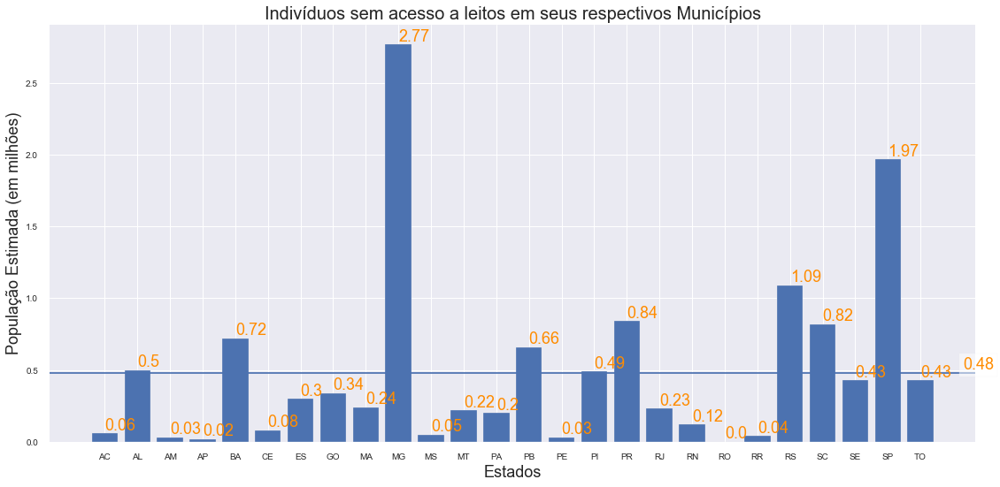

In [56]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111)
x = groupby_estados_pop_sem_leitos['UF_tbProjPopTCU']
y = round(groupby_estados_pop_sem_leitos['POPULACAO_ESTIMADA _tbProjPopTCU']/1000000,2)
plt.title('Indivíduos sem acesso a leitos em seus respectivos Municípios',fontsize=20)
plt.xlabel('Estados',fontsize=18)
plt.ylabel('População Estimada (em milhões)',fontsize=18)
plt.rcParams.update({'font.size': 18})
ax.bar(x,y)
ax.axhline(0.48)
ax.text(1.02, 0.48, 0.48, va='bottom', ha="right", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=18))
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=18), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('individuos_sem_leitos_estados.png')
plt.show()

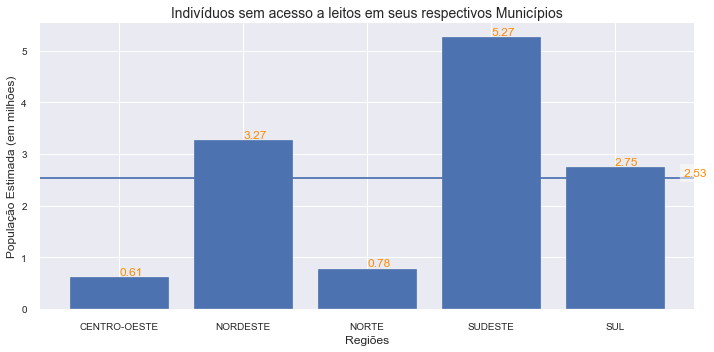

In [52]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = groupby_regioes_pop_sem_leitos['NM_REG']
y = round(groupby_regioes_pop_sem_leitos['POPULACAO_ESTIMADA _tbProjPopTCU']/1000000,2)
plt.title('Indivíduos sem acesso a leitos em seus respectivos Municípios',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('População Estimada (em milhões)',fontsize=12)
ax.bar(x,y)
ax.axhline(2.53)
ax.text(1.02, 2.53, 2.53, va='bottom', ha="right", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=12))
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.show()

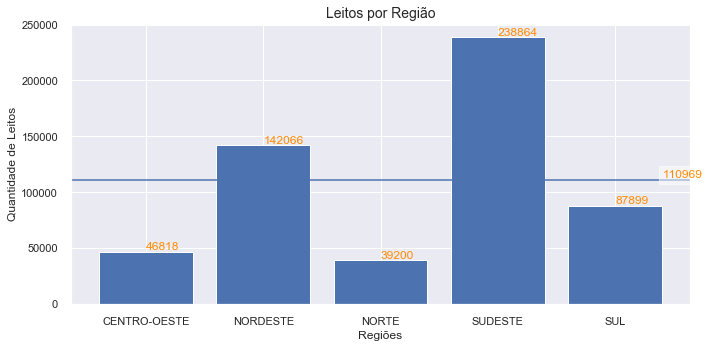

In [37]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = groupby_regioes['NM_REG']
y = groupby_regioes['QT_EXIST_LEITOS_rlEstabComplementar']
plt.title('Leitos por Região',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('Quantidade de Leitos',fontsize=12)
ax.bar(x,y)
ax.axhline(110969)
ax.text(1.02, 110969, media_leitos_regioes, va='bottom', ha="right", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=12))
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('leitos_por_regiao.png')
plt.show()

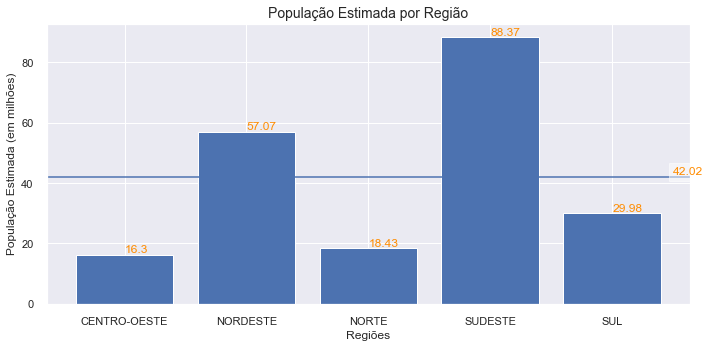

In [39]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = groupby_regioes_pop['NM_REG']
y = round(groupby_regioes_pop['POPULACAO_ESTIMADA _tbProjPopTCU']/1000000,2)
plt.title('População Estimada por Região',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('População Estimada (em milhões)',fontsize=12)
ax.bar(x,y)
ax.axhline(42.02)
ax.text(1.02, 42.02, 42.02, va='bottom', ha="right", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=12))
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('populacao_estimada_por_regiao.png')
plt.show()

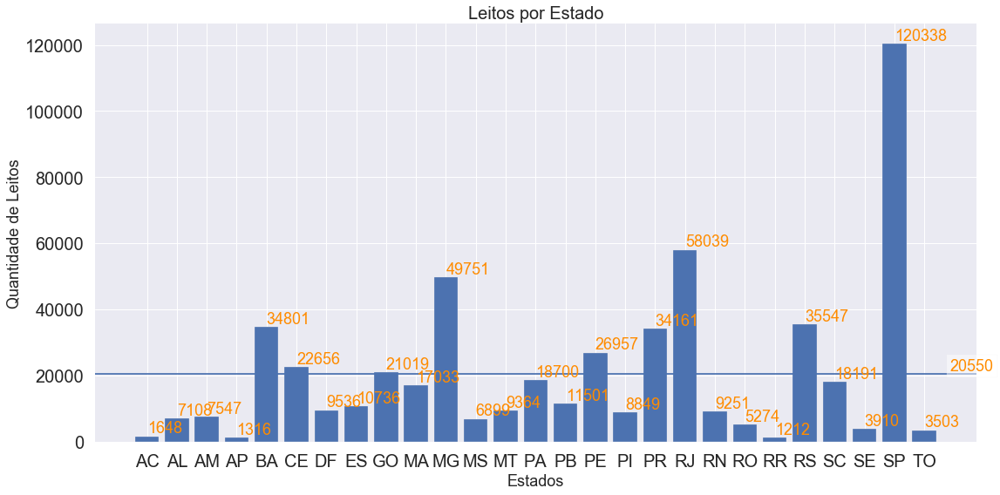

In [31]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111)
x = groupby_estados['UF_tbProjPopTCU']
y = groupby_estados['QT_EXIST_LEITOS_rlEstabComplementar']
plt.title('Leitos por Estado',fontsize=20)
plt.xlabel('Estados',fontsize=18)
plt.ylabel('Quantidade de Leitos',fontsize=18)
plt.rcParams.update({'font.size': 10})
ax.bar(x,y)
ax.axhline(20550)
ax.text(1.02, 20550, media_leitos_estados, va='bottom', ha="right", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=18))
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=18), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('leitos_por_estado.png')
plt.show()

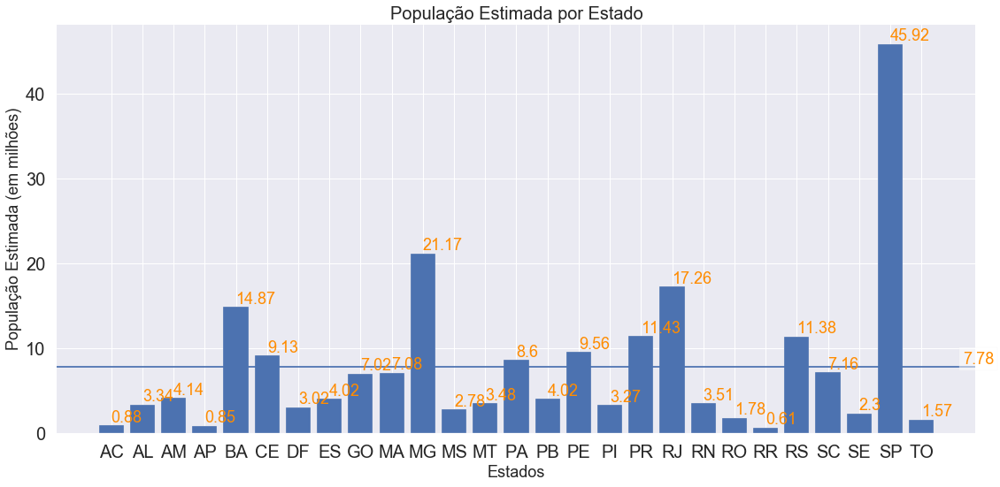

In [29]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111)
x = groupby_estados_pop['UF_tbProjPopTCU']
y = round(groupby_estados_pop['POPULACAO_ESTIMADA _tbProjPopTCU']/1000000,2)
plt.title('População Estimada por Estado',fontsize=20)
plt.xlabel('Estados',fontsize=18)
plt.ylabel('População Estimada (em milhões)',fontsize=18)
plt.rcParams.update({'font.size': 18})
ax.bar(x,y)
ax.axhline(7.78)
ax.text(1.02, 7.78, 7.78, va='bottom', ha="right", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=18))
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=18), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('populacao_estimada_por_estado.png')
plt.show()

In [57]:
base_ml = base_full[['COD_MUNIC7_tbProjPopTCU','COD_REG','COD_UF_tbProjPopTCU','COD_MUNIC_tbProjPopTCU',\
                  'POPULACAO_ESTIMADA _tbProjPopTCU','AREA_MUN','DENSIDADE_POP',\
                  'capital_tbMunLatLong','latitude_tbMunLatLong','longitude_tbMunLatLong',\
                  'CENTRAL_DE_ABASTECIMENTO','CENTRAL_DE_GESTAO_EM_SAUDE','CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL',\
                  'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE','CENTRAL_DE_REGULACAO_DO_ACESSO','CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS',\
                  'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA','CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA','CENTRO_DE_ATENCAO_PSICOSSOCIAL',\
                  'CENTRO_DE_IMUNIZACAO','CENTRO_DE_PARTO_NORMAL_-_ISOLADO','CENTRO_DE_SAUDE_UNIDADE_BASICA','CLINICA_CENTRO_DE_ESPECIALIDADE',\
                  'CONSULTORIO_ISOLADO','COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE','FARMACIA','HOSPITAL_ESPECIALIZADO',\
                  'HOSPITAL_GERAL','HOSPITAL_DIA_-_ISOLADO','LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN','LABORATORIO_DE_SAUDE_PUBLICA',\
                  'OFICINA_ORTOPEDICA','POLICLINICA','POLO_ACADEMIA_DA_SAUDE','POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE',\
                  'POSTO_DE_SAUDE','PRONTO_ATENDIMENTO','PRONTO_SOCORRO_ESPECIALIZADO','PRONTO_SOCORRO_GERAL',\
                  'SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE','TELESSAUDE','UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO',\
                  'UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA','UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL','UNIDADE_DE_VIGILANCIA_EM_SAUDE',\
                  'UNIDADE_MISTA','UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA','UNIDADE_MOVEL_FLUVIAL','UNIDADE_MOVEL_TERRESTRE',\
                  'QT_UNIDADES_BASICAS','QT_EXIST_LEITOS_rlEstabComplementar']]
base_ml.shape

(5570, 51)

In [58]:
base_ml.to_csv(r'base_tcc_Bruno_final_ml.csv', index = None, header=True, sep=';', encoding='utf-8')

### Machine Learning Process

In [12]:
base_ml = pd.read_csv('base_tcc_Bruno_final_ml.csv', sep = ';', header=0, encoding='utf-8')

In [13]:
# setting the number of cross validations used in the Model part 
nr_cv = 10

# switch for using log values   
use_logvals = 1    
# target used for correlation 
target = 'QT_EXIST_LEITOS_rlEstabComplementar'
    
# only columns with correlation above this threshold value  
min_val_corr = 0.4    
    
# switch for dropping columns that are similar to others already used and show a high correlation to these     
drop_similar = 1

#### Some useful functions

In [4]:
def get_best_score(grid):
    
    best_score = np.sqrt(-grid.best_score_)
    print(best_score)    
    print(grid.best_params_)
    print(grid.best_estimator_)
    
    return best_score

In [5]:
def plot_corr_matrix(df, nr_c, targ) :
    
    corr = df.corr()
    corr_abs = corr.abs()
    cols = corr_abs.nlargest(nr_c, targ)[targ].index
    cm = np.corrcoef(df[cols].values.T)

    plt.figure(figsize=(nr_c/1.5, nr_c/1.5))
    sns.set(font_scale=1.25)
    sns.heatmap(cm, linewidths=1.5, annot=True, square=True, 
                fmt='.2f', annot_kws={'size': 10}, 
                yticklabels=cols.values, xticklabels=cols.values
               )
    plt.show()

#### Load Data

In [14]:
df_train = base_ml.loc[base_ml['QT_EXIST_LEITOS_rlEstabComplementar'] != 0.0]
df_test = base_ml.loc[base_ml['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
df_test.drop('QT_EXIST_LEITOS_rlEstabComplementar', axis=1, inplace=True)

In [116]:
df_train

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1100064,1,11,64,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1100072,1,11,72,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1100080,1,11,80,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1100098,1,11,98,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1100106,1,11,106,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [94]:
id_test = df_test['COD_MUNIC7_tbProjPopTCU']

In [16]:
def reject_outliers(df_train):
    u = np.mean(df_train.QT_EXIST_LEITOS_rlEstabComplementar)
    s = np.std(df_train.QT_EXIST_LEITOS_rlEstabComplementar)
    df_train = df_train[(df_train.QT_EXIST_LEITOS_rlEstabComplementar > u-2*s) & (df_train.QT_EXIST_LEITOS_rlEstabComplementar < u+2*s)]
    return df_train

In [17]:
df_train=reject_outliers(df_train)

In [21]:
df_train.shape

(3671, 51)

In [22]:
df_train

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1100064,1,11,64,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1100072,1,11,72,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1100080,1,11,80,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1100098,1,11,98,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1100106,1,11,106,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


#### shape, info, head and describe

In [134]:
print(df_train.shape)
print("*"*50)
print(df_test.shape)

(3706, 51)
**************************************************
(1864, 51)


In [14]:
print(df_train.info())
print("*"*50)
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3706 entries, 0 to 5569
Data columns (total 51 columns):
COD_MUNIC7_tbProjPopTCU                                         3706 non-null int64
COD_REG                                                         3706 non-null int64
COD_UF_tbProjPopTCU                                             3706 non-null int64
COD_MUNIC_tbProjPopTCU                                          3706 non-null int64
POPULACAO_ESTIMADA _tbProjPopTCU                                3706 non-null int64
AREA_MUN                                                        3706 non-null float64
DENSIDADE_POP                                                   3706 non-null float64
capital_tbMunLatLong                                            3706 non-null int64
latitude_tbMunLatLong                                           3706 non-null float64
longitude_tbMunLatLong                                          3706 non-null float64
CENTRAL_DE_ABASTECIMENTO                     

In [15]:
df_train.head()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0


In [16]:
df_train.describe()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
count,3.706000e+03,3706.000000,3706.000000,3706.000000,3.706000e+03,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000
mean,3.198342e+06,2.837021,31.843497,13992.288451,5.328154e+04,2032.581730,161.021317,0.007285,-15.427735,-46.122688,0.048300,1.152725,0.033729,0.032110,0.304911,0.064490,0.281436,0.123853,0.824339,0.018618,0.008904,9.458176,15.450351,51.314085,0.213977,1.053697,0.337021,1.580950,0.209120,0.008365,0.122504,0.008365,2.694819,0.597140,0.111441,2.542634,0.322450,0.032110,0.110362,0.242580,0.024285,7.549919,0.276039,0.021317,0.725040,0.183216,1.272531,0.021317,0.392876,99.770103,149.715866
std,1.034025e+06,1.134368,10.320207,14378.946726,2.701275e+05,6771.370461,763.266672,0.085055,8.380093,6.773682,0.339228,0.842776,0.244112,0.189594,0.649187,0.267738,0.771185,1.063713,2.132117,0.226286,0.107362,17.251979,116.536990,348.838475,2.671553,4.723511,2.960289,4.839062,1.860806,0.099582,0.442171,0.107406,18.639458,1.688377,0.631382,4.292345,1.191476,0.398099,0.578486,2.665363,0.208985,32.991698,2.237975,0.206059,1.367723,0.439174,5.702966,0.241070,1.332250,543.616950,950.128963
min,1.100015e+06,1.000000,11.000000,13.000000,1.034000e+03,15.331000,0.049349,0.000000,-33.525000,-72.899700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000
25%,2.410430e+06,2.000000,24.000000,4103.250000,1.013950e+04,275.225750,12.940563,0.000000,-22.548250,-50.793450,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [17]:
df_test.head()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
43,1101476,1,11,1476,2856,605.692,4.715268,0,-11.82950,-61.3153,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0.0
55,1200138,1,12,138,10266,3034.869,3.382683,0,-9.81528,-67.9550,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,9,0.0
56,1200179,1,12,179,11733,1701.974,6.893760,0,-10.56600,-67.6860,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,10,0.0
58,1200252,1,12,252,18411,1654.768,11.126031,0,-11.01880,-68.7341,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,12,0.0
73,1200807,1,12,807,18504,2604.885,7.103577,0,-9.58138,-67.5478,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,13,0.0


In [18]:
df_test.describe()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
count,1.864000e+03,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.0,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.0,1864.000000,1864.0,1864.0,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.0,1864.000000,1864.000000,1864.000000,1864.000000,1864.0
mean,3.363436e+06,3.018777,33.439914,19444.834764,6805.648069,517.733282,38.109658,0.0,-18.479906,-46.446353,0.010193,1.004292,0.006974,0.021459,0.111588,0.001073,0.104614,0.006438,0.072425,0.000536,0.001073,2.626609,0.619635,1.312232,0.0,0.284871,0.0,0.0,0.001073,0.001073,0.048820,0.000536,0.149678,0.383047,0.013948,1.005901,0.088519,0.000536,0.022532,0.006974,0.002146,0.850858,0.094421,0.003219,0.267167,0.0,0.122318,0.000536,0.065987,9.313305,0.0
std,8.690359e+05,0.979210,8.692927,18276.328040,7147.593051,1118.837591,91.454213,0.0,7.709458,5.607955,0.105680,0.163768,0.083243,0.144948,0.321688,0.032747,0.326500,0.103411,0.263368,0.023162,0.032747,2.116839,1.225363,3.305543,0.0,0.609345,0.0,0.0,0.032747,0.032747,0.241392,0.023162,0.470972,0.552409,0.134371,1.757269,0.295243,0.023162,0.152019,0.089459,0.046287,1.299188,1.947428,0.065451,0.499571,0.0,0.364936,0.023162,0.258908,7.697482,0.0
min,1.101476e+06,1.000000,11.000000,27.000000,781.000000,3.565000,0.277225,0.0,-33.686600,-68.734100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.0
25%,2.807476e+06,2.000000,28.000000,5507.750000,3153.000000,135.212250,10.347906,0.0,-24.009975,-51.077950,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,5.000000,0.0
50%,3.166352e+06,3.000000,31.000000,13179.500000,4895.000000,237.757000,19.937185,0.0,-20.281300,-47.451550,0.000000,1.000000,0.000000,0.000000,0.000000,0.0

#### List of features with missing values 

In [10]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(60)

,Total,Percent
QT_EXIST_LEITOS_rlEstabComplementar,0,0.0
CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,0,0.0
CLINICA_CENTRO_DE_ESPECIALIDADE,0,0.0
CENTRO_DE_SAUDE_UNIDADE_BASICA,0,0.0
CENTRO_DE_PARTO_NORMAL_-_ISOLADO,0,0.0
CENTRO_DE_IMUNIZACAO,0,0.0
CENTRO_DE_ATENCAO_PSICOSSOCIAL,0,0.0
CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,0,0.0
CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,0,0.0
CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,0,0.0


In [12]:
df_train[df_train.columns[1:-1]].apply(lambda x: x.corr(df_train['QT_EXIST_LEITOS_rlEstabComplementar']))

COD_REG                                                         0.012896
COD_UF_tbProjPopTCU                                             0.016714
COD_MUNIC_tbProjPopTCU                                          0.026354
POPULACAO_ESTIMADA _tbProjPopTCU                                0.972253
AREA_MUN                                                       -0.001341
DENSIDADE_POP                                                   0.409996
capital_tbMunLatLong                                            0.629804
latitude_tbMunLatLong                                          -0.040817
longitude_tbMunLatLong                                          0.007939
CENTRAL_DE_ABASTECIMENTO                                        0.446169
CENTRAL_DE_GESTAO_EM_SAUDE                                      0.677994
CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL    0.699163
CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE                       0.228136
CENTRAL_DE_REGULACAO_DO_ACESSO                     

In [135]:
df_train

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1100064,1,11,64,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1100072,1,11,72,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1100080,1,11,80,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1100098,1,11,98,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1100106,1,11,106,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [174]:
df_train = df_train[['COD_MUNIC7_tbProjPopTCU', 'COD_REG', 'COD_UF_tbProjPopTCU',
       'COD_MUNIC_tbProjPopTCU', 'POPULACAO_ESTIMADA _tbProjPopTCU',
       'AREA_MUN', 'DENSIDADE_POP', 'capital_tbMunLatLong',
       'latitude_tbMunLatLong', 'longitude_tbMunLatLong',
       'CENTRAL_DE_ABASTECIMENTO', 'CENTRAL_DE_GESTAO_EM_SAUDE',
       'CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL',
       'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE',
       'CENTRAL_DE_REGULACAO_DO_ACESSO',
       'CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS',
       'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA',
       'CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA',
       'CENTRO_DE_ATENCAO_PSICOSSOCIAL', 'CENTRO_DE_IMUNIZACAO',
       'CENTRO_DE_PARTO_NORMAL_-_ISOLADO', 'CENTRO_DE_SAUDE_UNIDADE_BASICA',
       'CLINICA_CENTRO_DE_ESPECIALIDADE', 'CONSULTORIO_ISOLADO',
       'COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE',
       'FARMACIA', 'HOSPITAL_ESPECIALIZADO', 'HOSPITAL_GERAL',
       'HOSPITAL_DIA_-_ISOLADO', 'LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN','QT_EXIST_LEITOS_rlEstabComplementar']]

In [34]:
y = df_train['QT_EXIST_LEITOS_rlEstabComplementar']
X = df_train.drop('QT_EXIST_LEITOS_rlEstabComplementar', axis=1)

In [19]:
from sklearn.model_selection import GridSearchCV
score_calc = 'neg_mean_absolute_error'

#### Linear Regression 

In [20]:
from sklearn.linear_model import LinearRegression

linreg = LinearRegression()
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid_linear = GridSearchCV(linreg, parameters, cv=nr_cv, verbose=1 , scoring = score_calc)
grid_linear.fit(X, y)

sc_linear = get_best_score(grid_linear)

Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


5.985349255265824
{'copy_X': True, 'fit_intercept': False, 'normalize': True}
LinearRegression(copy_X=True, fit_intercept=False, n_jobs=None,
         normalize=True)


[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:    1.8s finished


#### Ridge 

In [21]:
from sklearn.linear_model import Ridge

ridge = Ridge()
parameters = {'alpha':[0.001,0.005,0.01,0.1,0.5,1], 'normalize':[True,False], 'tol':[1e-06,5e-06,1e-05,5e-05]}
grid_ridge = GridSearchCV(ridge, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_ridge.fit(X, y)

sc_ridge = get_best_score(grid_ridge)

Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


5.9615424806701895
{'alpha': 0.1, 'normalize': True, 'tol': 1e-06}
Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=True, random_state=None, solver='auto', tol=1e-06)


[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    6.9s finished


#### Lasso

In [22]:
from sklearn.linear_model import Lasso

lasso = Lasso()
parameters = {'alpha':[1e-03,0.01,0.1,0.5,0.8,1], 'normalize':[True,False], 'tol':[1e-06,1e-05,5e-05,1e-04,5e-04,1e-03]}
grid_lasso = GridSearchCV(lasso, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_lasso.fit(X, y)

sc_lasso = get_best_score(grid_lasso)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 10 folds for each of 72 candidates, totalling 720 fits
5.793497324528498
{'alpha': 0.1, 'normalize': True, 'tol': 1e-06}
Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=True, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=1e-06, warm_start=False)


[Parallel(n_jobs=1)]: Done 720 out of 720 | elapsed:  1.9min finished


#### ElasticNet

In [23]:
from sklearn.linear_model import ElasticNet

enet = ElasticNet()
parameters = {'alpha' :[0.1,1.0,10], 'max_iter' :[10000], 'l1_ratio':[0.04,0.05], 
              'fit_intercept' : [False,True], 'normalize':[True,False], 'tol':[1e-02,1e-03,1e-04]}
grid_enet = GridSearchCV(enet, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_enet.fit(X, y)

sc_enet = get_best_score(grid_enet)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=1)]: Done 720 out of 720 | elapsed: 19.4min finished


5.864933072944218
{'alpha': 0.1, 'fit_intercept': False, 'l1_ratio': 0.04, 'max_iter': 10000, 'normalize': True, 'tol': 0.01}
ElasticNet(alpha=0.1, copy_X=True, fit_intercept=False, l1_ratio=0.04,
      max_iter=10000, normalize=True, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.01, warm_start=False)


#### DecisionTreeRegressor

In [24]:
from sklearn.tree import DecisionTreeRegressor

param_grid = { 'max_depth' : [7,8,9,10] , 'max_features' : [11,12,13,14,15,16,17,18,19,20,21,22,23,24,25] ,
               'max_leaf_nodes' : [None, 12,15,18,20] ,'min_samples_split' : [20,25,30],
                'presort': [False,True] , 'random_state': [5] }
            
grid_dtree = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_dtree.fit(X, y)

sc_dtree = get_best_score(grid_dtree)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


5.946034069895945
{'max_depth': 8, 'max_features': 17, 'max_leaf_nodes': None, 'min_samples_split': 30, 'presort': False, 'random_state': 5}
DecisionTreeRegressor(criterion='mse', max_depth=8, max_features=17,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=30, min_weight_fraction_leaf=0.0,
           presort=False, random_state=5, splitter='best')


[Parallel(n_jobs=1)]: Done 18000 out of 18000 | elapsed:  7.6min finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


#### RandomForestRegressor

In [25]:
from sklearn.ensemble import RandomForestRegressor

param_grid = {'min_samples_split' : [3,4,6,10], 'n_estimators' : [70,100], 'random_state': [5] }
grid_rf = GridSearchCV(RandomForestRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_rf.fit(X, y)

sc_rf = get_best_score(grid_rf)

Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  5.4min finished


5.653703191482439
{'min_samples_split': 4, 'n_estimators': 100, 'random_state': 5}
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=4,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=5, verbose=0, warm_start=False)


#### KNN Regressor

In [26]:
from sklearn.neighbors import KNeighborsRegressor

param_grid = {'n_neighbors' : [3,4,5,6,7,10,15] ,    
              'weights' : ['uniform','distance'] ,
              'algorithm' : ['ball_tree', 'kd_tree', 'brute']}

grid_knn = GridSearchCV(KNeighborsRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_knn.fit(X, y)

sc_knn = get_best_score(grid_knn)

Fitting 10 folds for each of 42 candidates, totalling 420 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


6.947593450503071
{'algorithm': 'ball_tree', 'n_neighbors': 10, 'weights': 'uniform'}
KNeighborsRegressor(algorithm='ball_tree', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=None, n_neighbors=10, p=2,
          weights='uniform')


[Parallel(n_jobs=1)]: Done 420 out of 420 | elapsed:  1.6min finished


#### Comparison plot: RMSE of all models

In [27]:
list_scores = [sc_linear, sc_ridge, sc_lasso, sc_enet,
               sc_dtree, sc_rf, sc_knn]
list_scores = list(np.around(np.array(list_scores),3))
list_regressors = ['LR','Ridge','Lasso','Elastic Net','DTR','RF','KNN']

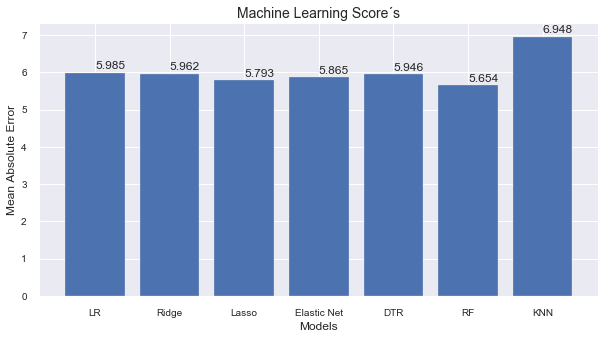

In [28]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = list_regressors
y = list_scores
plt.title('Machine Learning Score´s',fontsize=14)
plt.xlabel('Models',fontsize=12)
plt.ylabel('Mean Absolute Error',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data+0.1, s=f"{data}" , fontdict=dict(fontsize=12))
plt.savefig('resultados_finais.png')    
plt.show()

In [30]:
base_perfil = base_v2[['NOME_MUNICIPIO_tbProjPopTCU','POPULACAO_ESTIMADA _tbProjPopTCU','QT_EXIST_LEITOS_rlEstabComplementar']]

In [31]:
base_perfil.sort_values('QT_EXIST_LEITOS_rlEstabComplementar', ascending=False )

,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,QT_EXIST_LEITOS_rlEstabComplementar
3829,São Paulo,12252023,38579.0
3242,Rio de Janeiro,6718903,27691.0
1596,Recife,1645727,11290.0
2309,Belo Horizonte,2512070,10997.0
949,Fortaleza,2669342,10681.0
2162,Salvador,2872347,10379.0
5569,Brasília,3015268,9536.0
4931,Porto Alegre,1483771,8521.0
5417,Goiânia,1516113,8058.0
4005,Curitiba,1933105,6708.0


In [53]:
id_train = X['COD_MUNIC7_tbProjPopTCU']
rf_pred = grid_rf.predict(X)
base_check = pd.DataFrame()
base_check ['Id'] = id_train
base_check ['Leitos_original'] = y
base_check ['Leitos_predito'] = rf_pred

In [55]:
base_check.Leitos_predito = base_check.Leitos_predito.round()

In [58]:
def f(row):
    if row['Leitos_predito'] > row['Leitos_original']:
        val = "Maior"
    elif row['Leitos_predito'] < row['Leitos_original']:
        val = "Menor"
    else:
        val = "Igual"
    return val

In [59]:
base_check['Check'] = base_check.apply(f, axis=1)

In [70]:
base_com_leitos = base_full.loc[base_full['QT_EXIST_LEITOS_rlEstabComplementar'] != 0.0]

In [71]:
base_analise = pd.merge(base_com_leitos, base_check, left_on="COD_MUNIC7_tbProjPopTCU", right_on="Id", how='inner')
base_analise = base_analise.drop(['Id'], axis=1)
base_analise.shape

(3671, 58)

In [82]:
base_maior = base_analise.loc[base_analise['Check'] == 'Maior']
base_menor = base_analise.loc[base_analise['Check'] == 'Menor']
base_igual = base_analise.loc[base_analise['Check'] == 'Igual']

In [73]:
base_maior

,COD_REG,NM_REG,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar,Leitos_original,Leitos_predito,Check
0,1,NORTE,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,7067.025,3.246769,0,-11.928300,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0,51.0,57.0,Maior
1,1,NORTE,RO,11,23,1100023,110002,Ariquemes,107863,4426.571,24.367168,0,-9.905710,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0,317.0,326.0,Maior
2,1,NORTE,RO,11,31,1100031,110003,Cabixi,5312,1314.352,4.041535,0,-13.494500,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0,9.0,13.0,Maior
6,1,NORTE,RO,11,72,1100072,110007,Corumbiara,7391,3060.321,2.415106,0,-12.955100,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0,16.0,17.0,Maior
8,1,NORTE,RO,11,98,1100098,110009,Espigão D'Oeste,32374,4518.027,7.165517,0,-11.526600,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0,55.0,67.0,Maior
10,1,NORTE,RO,11,114,1100114,110011,Jaru,51775,2944.128,17.585852,0,-10.431800,-62.4788,0,1,0,0,1,0,0,0,1,0,0,10,20,81,0,24,0,3,0,0,1,0,0,1,0,3,0,0,0,0,0,18,4,0,4,0,0,0,1,173,138.0,138.0,146.0,Maior
11,1,NORTE,RO,11,122,1100122,110012,Ji-Paraná,128969,6896.649,18.700241,0,-10.877700,-61.9322,1,2,0,0,1,0,2,1,2,0,0,16,33,250,1,68,1,7,1,0,0,1,4,2,0,5,0,0,0,2,0,38,7,0,7,0,0,0,2,454,330.0,330.0,373.0,Maior
13,1,NORTE,RO,11,148,1100148,110014,Nova Brasilândia D'Oeste,20474,1703.008,12.022257,0,-11.724700,-62.3127,0,1,0,0,0,0,0,0,0,0,0,4,4,9,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,5,0,0,1,0,0,0,0,26,44.0,44.0,47.0,Maior
14,1,NORTE,RO,11,155,1100155,110015,Ouro Preto do Oeste,36035,1969.850,18.293271,0,-10.716700,-62.2565,0,2,0,0,1,0,0,0,1,0,0,3,18,11,0,2,0,4,0,0,0,0,0,0,0,13,0,0,0,0,0,10,0,0,2,0,0,0,0,67,89.0,89.0,112.0,Maior
15,1,NORTE,RO,11,189,1100189,110018,Pimenta Bueno,36660,6240.940,5.874115,0,-11.672000,-61.1980,0,2,0,0,1,0,0,0,1,0,0,6,9,86,0,13,0,2,0,0,1,0,2,0,0,2,0,0,0,0,0,9,0,0,6,0,0,0,0,140,58.0,58.0,85.0,Maior


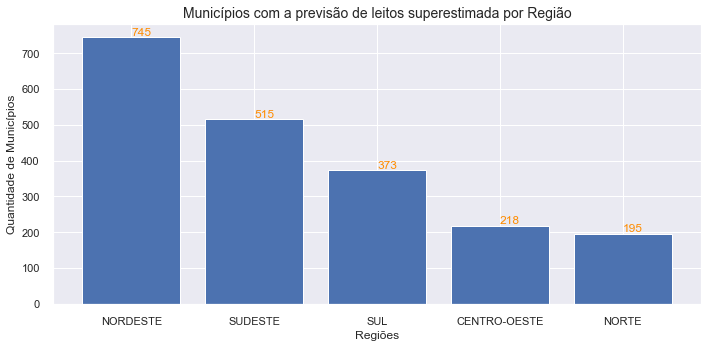

In [99]:
base_filter = base_maior['NM_REG'].value_counts().reset_index()
base_filter.columns = ['NM_REG', 'MUNICIPIOS']
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = base_filter['NM_REG']
y = base_filter['MUNICIPIOS']
plt.title('Municípios com a previsão de leitos superestimada por Região',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('Quantidade de Municípios',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('mun_reg_sup.png')
plt.show()

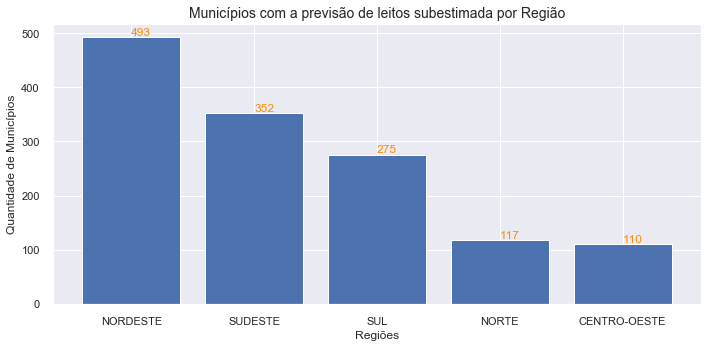

In [100]:
base_filter = base_menor['NM_REG'].value_counts().reset_index()
base_filter.columns = ['NM_REG', 'MUNICIPIOS']
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = base_filter['NM_REG']
y = base_filter['MUNICIPIOS']
plt.title('Municípios com a previsão de leitos subestimada por Região',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('Quantidade de Municípios',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('mun_reg_sub.png')
plt.show()

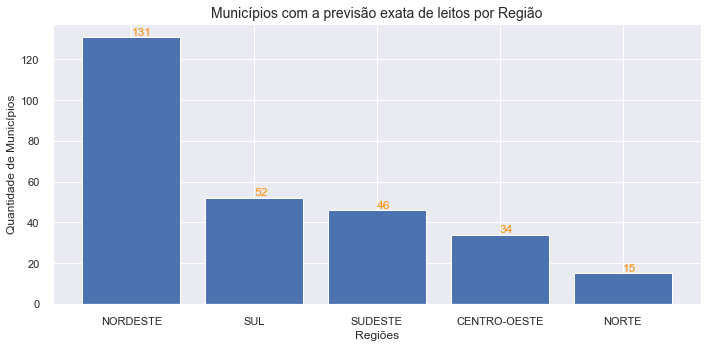

In [90]:
base_filter = base_igual['NM_REG'].value_counts().reset_index()
base_filter.columns = ['NM_REG', 'MUNICIPIOS']
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = base_filter['NM_REG']
y = base_filter['MUNICIPIOS']
plt.title('Municípios com a previsão exata de leitos por Região',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('Quantidade de Municípios',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.show()

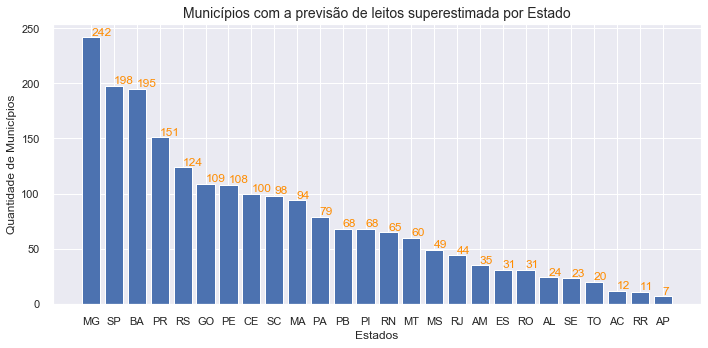

In [101]:
base_filter = base_maior['UF_tbProjPopTCU'].value_counts().reset_index()
base_filter.columns = ['UF_tbProjPopTCU', 'MUNICIPIOS']
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = base_filter['UF_tbProjPopTCU']
y = base_filter['MUNICIPIOS']
plt.title('Municípios com a previsão de leitos superestimada por Estado',fontsize=14)
plt.xlabel('Estados',fontsize=12)
plt.ylabel('Quantidade de Municípios',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('mun_est_sup.png')
plt.show()

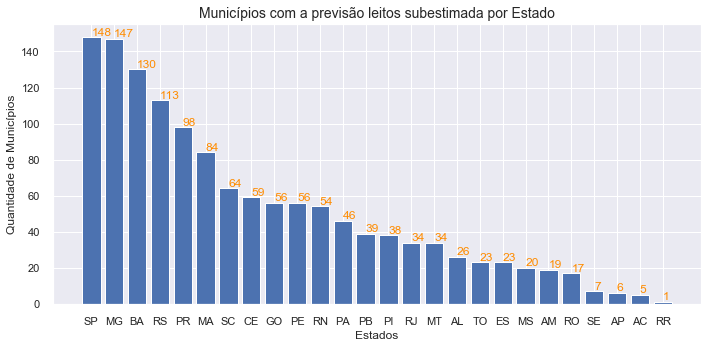

In [102]:
base_filter = base_menor['UF_tbProjPopTCU'].value_counts().reset_index()
base_filter.columns = ['UF_tbProjPopTCU', 'MUNICIPIOS']
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = base_filter['UF_tbProjPopTCU']
y = base_filter['MUNICIPIOS']
plt.title('Municípios com a previsão leitos subestimada por Estado',fontsize=14)
plt.xlabel('Estados',fontsize=12)
plt.ylabel('Quantidade de Municípios',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.savefig('mun_est_sub.png')
plt.show()

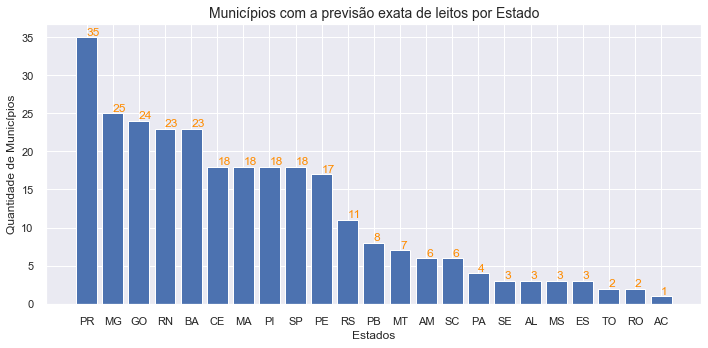

In [93]:
base_filter = base_igual['UF_tbProjPopTCU'].value_counts().reset_index()
base_filter.columns = ['UF_tbProjPopTCU', 'MUNICIPIOS']
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = base_filter['UF_tbProjPopTCU']
y = base_filter['MUNICIPIOS']
plt.title('Municípios com a previsão exata de leitos por Estado',fontsize=14)
plt.xlabel('Estados',fontsize=12)
plt.ylabel('Quantidade de Municípios',fontsize=12)
ax.bar(x,y)
for index,data in enumerate(y):
    plt.text(x=index , y =data , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange", va='bottom',ha="left")
plt.tight_layout()
plt.show()

In [95]:
rf_pred = grid_rf.predict(df_test)
mun_zero_pred = pd.DataFrame()
mun_zero_pred ['Id'] = id_test
mun_zero_pred ['QT_EXIST_LEITOS_rlEstabComplementar'] = rf_pred

In [96]:
mun_zero_pred['QT_EXIST_LEITOS_rlEstabComplementar'] = round(mun_zero_pred['QT_EXIST_LEITOS_rlEstabComplementar'])

In [97]:
mun_zero_pred.describe()

,Id,QT_EXIST_LEITOS_rlEstabComplementar
count,1.864000e+03,1864.000000
mean,3.363436e+06,13.584227
std,8.690359e+05,7.767860
min,1.101476e+06,6.000000
25%,2.807476e+06,10.000000
50%,3.166352e+06,12.000000
75%,4.201666e+06,14.000000
max,5.222302e+06,105.000000


In [98]:
mun_zero_pred

,Id,QT_EXIST_LEITOS_rlEstabComplementar
43,1101476,10.0
55,1200138,17.0
56,1200179,16.0
58,1200252,21.0
73,1200807,20.0
92,1301159,25.0
136,1400027,34.0
140,1400175,25.0
150,1400704,41.0
173,1501600,20.0


In [95]:
base_teste_resultado = pd.merge(df_test, mun_zero_pred, left_on="COD_MUNIC7_tbProjPopTCU", right_on="Id", how='inner')
base_teste_resultado = base_teste_resultado.drop(['Id'], axis=1)
base_teste_resultado.shape

(1864, 51)

In [96]:
base_teste_resultado

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1101476,1,11,1476,2856,605.692,4.715268,0,-11.829500,-61.3153,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,10.0
1,1200138,1,12,138,10266,3034.869,3.382683,0,-9.815280,-67.9550,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,9,17.0
2,1200179,1,12,179,11733,1701.974,6.893760,0,-10.566000,-67.6860,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,10,16.0
3,1200252,1,12,252,18411,1654.768,11.126031,0,-11.018800,-68.7341,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,12,21.0
4,1200807,1,12,807,18504,2604.885,7.103577,0,-9.581380,-67.5478,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,13,20.0
5,1301159,1,13,1159,30225,2627.474,11.503444,0,-3.314000,-59.5557,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,17,0,0,0,0,0,0,0,0,0,0,0,1,0,21,25.0
6,1400027,1,14,27,12796,28472.310,0.449419,0,3.645710,-61.3692,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,1,0,6,0,0,0,0,0,0,29,0,2,0,1,0,1,48,34.0
7,1400175,1,14,175,18335,7664.831,2.392094,0,2.609940,-60.6058,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,6,0,2,0,1,0,1,35,25.0
8,1400704,1,14,704,10559,8065.564,1.309146,0,4.603140,-60.1815,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,1,1,0,0,0,0,4,0,0,0,0,0,0,77,0,2,0,1,0,0,93,41.0
9,1501600,1,15,1600,16286,586.736,27.756947,0,-1.367450,-47.3066,0,1,0,0,1,0,1,0,0,0,0,1,3,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,2,0,0,1,0,0,0,0,17,20.0


In [97]:
base_merged = pd.concat([df_train,base_teste_resultado], ignore_index=True)

In [98]:
base_merged

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1100064,1,11,64,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1100072,1,11,72,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1100080,1,11,80,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1100098,1,11,98,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1100106,1,11,106,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0
